## Configuration

In [1]:
import sys
import os

model_name = 'exp-25-v1.0.pkl'
SEED = 42
VAL_PCT = 0.2
INFER = True
DEBUG = True
VIZ = True
TTA = True
DEEP_ENS = False

GRADIENT = os.path.exists('train')
KAGGLE = os.path.exists('../input')

if KAGGLE:
    !mkdir -p uwmadisonutils
    !cp ../input/uw-madison-models/*.py uwmadisonutils/
    !cp -r ../input/pytorch-segmentation-models-lib/ ./
    !pip install -q ./pytorch-segmentation-models-lib/pretrainedmodels-0.7.4/pretrainedmodels-0.7.4
    !pip install -q ./pytorch-segmentation-models-lib/efficientnet_pytorch-0.6.3/efficientnet_pytorch-0.6.3
    !pip install -q ./pytorch-segmentation-models-lib/timm-0.4.12-py3-none-any.whl
    !pip install -q ./pytorch-segmentation-models-lib/segmentation_models_pytorch-0.2.0-py3-none-any.whl


if KAGGLE:
    sys.path.insert(0, '../input/uwmadisonutils/')
    data_path = '../input/uw-madison-gi-tract-image-segmentation/'
    model_name = '../input/uw-madison-models/' + model_name
    
elif GRADIENT:
    sys.path.insert(0, 'uwmadisonutils/')
    data_path = ''
    model_name = 'uwmadisonutils/' + model_name 

from uwmadisonutils.utilities import *

## Libraries and Data

In [2]:
path = Path(data_path+'train')
test_path = Path(data_path+'test')

train = pd.read_csv(data_path+'train.csv', low_memory=False)
sample_submission = pd.read_csv(data_path+'sample_submission.csv', low_memory=False).rename(columns={'predicted': 'segmentation'})

train_path = Path(data_path+'train')
test_path = Path(data_path+'test')

train_fnames = get_image_files(train_path)
test_fnames = get_image_files(test_path)

## Prepare Data

In [3]:
if sample_submission.shape[0] > 0: 
    test = sample_submission.copy()
else:
    test_fnames = train_fnames
    test_path = train_path
    test = train.copy()
    test = test.sample(frac=1.0, random_state=SEED)

test = get_custom_df(test, test_fnames, str(test_path), channels=5)
train = get_custom_df(train, train_fnames, str(train_path), channels=5)

In [4]:
if DEBUG:
    test = test.iloc[:1000]
    test_fnames = test_fnames[:1000]

## Learner

In [5]:
@ToTensor
def encodes(self, o:np.ndarray): return TensorImage(image2tensor(o))


class SegmentationAlbumentationsTransform5C(ItemTransform, RandTransform):
    split_idx, order = None, 2
    def __init__(self, train_aug, valid_aug): store_attr()
    
    def before_call(self, b, split_idx): self.idx = split_idx
    
    def encodes(self, x):
        if len(x) > 1:
            img, mask = x
            if self.idx == 0:
                aug = self.train_aug(image=np.array(img), mask=np.array(mask))    
            else:
                aug = self.valid_aug(image=np.array(img), mask=np.array(mask))
            return aug["image"], PILMask.create(aug["mask"])
        else:
            img = x[0]
            aug = self.valid_aug(image=np.array(img))
            return aug["image"]


def get_5C_25D_dls(df, up_size=(320, 384), crop=0.9, val_crop=0.9, bs=16, sample=False, sample_empty=False, frac=0.2, empty_frac=0.1, aug_p=0.5, val_pct=0.2, show=True, val='group', seed=42):
    
    df = df.copy()
    
    np.random.seed(seed)
    set_seed(seed, True)
    
    if val == 'group':
        df = add_group_valid(df, val_pct, seed)
    elif val == 'custom':
        df = add_custom_valid(df, val_pct, seed)
    
        
    if sample_empty:
        df = pd.concat([
            df.query('n_segs == 0 & is_valid == False').sample(frac=empty_frac, replace=False, random_state=seed),
            df.query('n_segs != 0 | is_valid == True')
        ])
    
    if sample:
        dev = df.sample(frac=frac, random_state=seed)
    else:
        dev = df.sample(frac=1.0, random_state=seed)
                
    tfms = [[partial(get_25D_image, up_size=up_size)],
            [partial(get_mask, up_size=up_size), PILMask.create]]
    
    after_item = [SegmentationAlbumentationsTransform5C(get_train_aug(up_size, crop=crop, p=aug_p), 
                                                        get_test_aug(up_size, crop=val_crop)),
                  ToTensor()]
    
    # tfms = [[get_25D_image, partial(cv2.resize, dsize=img_size)], [get_mask, partial(cv2.resize, dsize=img_size), PILMask.create]]
    # after_item = [SegmentationAlbumentationsTransform5C(get_train_aug(img_size), get_test_aug(img_size)), ToTensor()]

    splits = ColSplitter()(dev)
    dsets = Datasets(dev, tfms, splits=splits)
    dls = dsets.dataloaders(bs=bs, after_item=after_item,
                           after_batch=[IntToFloatTensor, Normalize.from_stats([0.485, 0.485, 0.456, 0.406, 0.406],
                                                                               [0.229, 0.229, 0.224, 0.225, 0.225])])
    dls.rng.seed(seed)
    
    if show:
        nrows = bs//4
        ncols = 4
        dls.show_batch(nrows=nrows, ncols=ncols, max_n=bs, figsize=(ncols*3, nrows*3))
        
    return dls, dev


@typedispatch
def show_batch(x:TensorImage, y:TensorMask, samples, ctxs=None, max_n=6, nrows=None, ncols=2, figsize=None, **kwargs):
    if figsize is None: figsize = (ncols*3, max_n//ncols * 3)
    if ctxs is None: ctxs = get_grid(max_n, nrows=nrows, ncols=ncols, figsize=figsize)
    for i,ctx in enumerate(ctxs): 
        x_i = x[i] / x[i].max()
        show_image(x_i[[1, 2, 3]], ctx=ctx, cmap='gray', **kwargs)
        show_image(y[i], ctx=ctx, cmap='Spectral_r', alpha=0.35, **kwargs)
        red_patch = mpatches.Patch(color='red', label='lb')
        green_patch = mpatches.Patch(color='green', label='sb')
        blue_patch = mpatches.Patch(color='blue', label='st')
        ctx.legend(handles=[red_patch, green_patch, blue_patch], fontsize=figsize[0]/2)
        
        
def get_train_aug(img_size, crop=0.9, p=0.4):
    crop_size = round(img_size[0]*crop)
    return albumentations.Compose([
            albumentations.RandomCrop(height=crop_size, width=crop_size, always_apply=True),
            albumentations.OneOf([
            albumentations.GridDistortion(num_steps=5, distort_limit=0.05, p=1.0),
            albumentations.ElasticTransform(alpha=1, sigma=50, alpha_affine=50, p=1.0)
            ], p=p),
            albumentations.CoarseDropout(
                max_holes=8, min_holes=8,
                max_height=crop_size//10, max_width=crop_size//10,
                min_height=4, min_width=4, mask_fill_value=0, p=0.2*p),
            albumentations.ShiftScaleRotate(
            shift_limit=0.0625, scale_limit=0.2, rotate_limit=25,
            interpolation=cv2.INTER_AREA, p=p),
            albumentations.HorizontalFlip(p=0.5*p),
            albumentations.OneOf([
                albumentations.MotionBlur(p=0.2*p),
                albumentations.MedianBlur(blur_limit=3, p=0.1*p),
                albumentations.Blur(blur_limit=3, p=0.1*p),
            ], p=0.2*p),
            albumentations.GaussNoise(var_limit=0.001, p=0.2*p),
                albumentations.OneOf([
                    albumentations.OpticalDistortion(p=0.3*p),
                    albumentations.GridDistortion(p=0.1*p),
                    albumentations.PiecewiseAffine(p=0.3*p),
                ], p=0.2*p),
                albumentations.OneOf([
                    albumentations.Sharpen(p=0.2*p),
                    albumentations.Emboss(p=0.2*p),
                    albumentations.RandomBrightnessContrast(p=0.2*p),
                ]),
            ])


def get_test_aug(img_size, crop=0.9):
    crop_size = round(crop*img_size[0])
    return  albumentations.Compose([
        albumentations.CenterCrop(height=crop_size, width=crop_size),
    ])


class TverskyLoss(BaseLoss):
    def __init__(self, *args, mode='multilabel', thresh=0.5, **kwargs):
        super().__init__(smp.losses.TverskyLoss, *args, mode=mode, flatten=False, is_2d=True, floatify=True, **kwargs)
        self.thresh = thresh
    
    def decodes(self, x:Tensor) -> Tensor:
        "Converts model output to target format"
        return (x>self.thresh).long()

    def activation(self, x:Tensor) -> Tensor:
        "`nn.BCEWithLogitsLoss`'s fused activation function applied to model output"
        return torch.sigmoid(x)
    
    
class SkipEmptyMetric(AvgMetric):        
    def accumulate(self, learn):
        score, bs = self.func(learn.pred, *learn.yb)
        if score is not None:
            self.total += learn.to_detach(score)*bs
            self.count += bs
        else:
            print('score is none')
            
def dice_coeff_adj_skip(inp, targ):
    inp = np.where(inp.cpu().detach().numpy() > 0.5, 1, 0)
    targ = targ.cpu().detach().numpy()
    inp = post_process(inp)
    eps = 1e-5
    dice_scores = []
    for i in range(targ.shape[0]):
        dice_i = []
        for j in range(targ.shape[1]):
            if inp[i, j].sum() == targ[i, j].sum() == 0:
                continue
            I = (targ[i, j] * inp[i, j]).sum()
            U =  targ[i, j].sum() + inp[i, j].sum()
            dice_i.append((2.*I)/(U+eps))
        if dice_i:
            dice_scores.append(np.mean(dice_i))
    
    if dice_scores:
        return np.mean(dice_scores), len(dice_scores)
    else:
        return None
    
def hd_dist_per_slice_norm(inp, targ, seed=42):    
    inp = np.argwhere(inp) / np.array(inp.shape)
    targ = np.argwhere(targ) / np.array(targ.shape)
    # if len(targ) == 0:
    #     inp = 1 - inp
    #     targ = 1 - targ
    haussdorf_dist = 1 - directed_hausdorff(inp, targ, seed)[0]
    return haussdorf_dist / np.sqrt(3) if haussdorf_dist > 0 else 0
    
    
def hd_dist_adj_skip(inp, targ, seed=42):
    inp = np.where(inp.cpu().detach().numpy() > 0.5, 1, 0)
    targ = targ.cpu().detach().numpy()
    inp = post_process(inp)
    hd_scores = []
    for i in range(targ.shape[0]):
        hd_i = []
        for j in range(targ.shape[1]):
            if inp[i, j].sum() == targ[i, j].sum() == 0:
                continue
            hd_i.append(hd_dist_per_slice(inp[i, j], targ[i, j], seed))
        if hd_i:
            hd_scores.append(np.mean(hd_i))
    if hd_scores:
        return np.mean(hd_scores), len(hd_scores)
    else:
        return None
    
def hd_dist_adj_norm(inp, targ, seed=42):
    inp = np.where(inp.cpu().detach().numpy() > 0.5, 1, 0)
    targ = targ.cpu().detach().numpy()
    inp = post_process(inp)
    hd_scores = []
    for i in range(targ.shape[0]):
        hd_i = []
        for j in range(targ.shape[1]):
            if inp[i, j].sum() == targ[i, j].sum() == 0:
                continue
            hd_i.append(hd_dist_per_slice_norm(inp[i, j], targ[i, j], seed))
        if hd_i:
            hd_scores.append(np.mean(hd_i))
    if hd_scores:
        return np.mean(hd_scores)
    else:
        return 0
    
    
def hd_dist_adj_skip_norm(inp, targ, seed=42):
    inp = np.where(inp.cpu().detach().numpy() > 0.5, 1, 0)
    targ = targ.cpu().detach().numpy()
    inp = post_process(inp)
    hd_scores = []
    for i in range(targ.shape[0]):
        hd_i = []
        for j in range(targ.shape[1]):
            if inp[i, j].sum() == targ[i, j].sum() == 0:
                continue
            hd_i.append(hd_dist_per_slice_norm(inp[i, j], targ[i, j], seed))
        if hd_i:
            hd_scores.append(np.mean(hd_i))
    if hd_scores:
        return np.mean(hd_scores), len(hd_scores)
    else:
        return None
    
class DiceLossSMP(BaseLoss):
    def __init__(self, *args, **kwargs):
        super().__init__(smp.losses.DiceLoss, *args, mode='multilabel', flatten=False, is_2d=True, floatify=True, **kwargs)

In [6]:
if not INFER:
    dls, dev = get_5C_25D_dls(train, bs=16, crop=0.9, show=True)

In [7]:
if not INFER:
    unet = smp.Unet(
        encoder_name='efficientnet-b0',      
        encoder_weights="imagenet",    
        in_channels=5,                 
        classes=3,       
        activation=None,
        )
    
    learn = get_custom_learner(dls, 
                               unet, 
                               # TverskyLoss(), 
                               ComboLoss(),
                               unet_splitter,
                               # opt_func=ranger,
                               cbs=[GradientAccumulation(32), 
                                # SaveModelCallback(with_opt=True, monitor='dice_coeff_adj', fname="test-model")
                                   ],
                               metrics = [
                                   AvgMetric(dice_coeff_adj),
                                   SkipEmptyMetric(dice_coeff_adj_skip),
                                   AvgMetric(hd_dist_adj),
                                   AvgMetric(hd_dist_adj_norm),
                                   SkipEmptyMetric(hd_dist_adj_skip),
                                   SkipEmptyMetric(hd_dist_adj_skip_norm),
                               ]
                              )
    
    # learn = get_custom_learner(dls, build_model('efficientnet-b0'), ComboLoss(), unet_splitter)
    # learn = get_custom_learner(dls, NestedUNet(3, 3, deep_supervision=True), deep_supervision_loss, splitter, metrics=[dice_coeff2, hd_dist2, custom_metric2])

In [8]:
# if not INFER:
#     learn = unet_learner(dls, resnet18, n_out=3, metrics=[dice_coeff, hd_dist, custom_metric], loss_func=BCEWithLogitsLossFlat()).to_fp16()

## Training

In [9]:
if not INFER:
    learn.lr_find()

In [10]:
lr = 1e-3

In [11]:
if not INFER:
    learn.fine_tune(10, lr, lr_mult=400)

In [12]:
# if not INFER:
#     learn.unfreeze()
#     learn.fit_one_cycle(10, slice(lr/400, lr/10))

## Show Results

In [13]:
if not INFER:
    learn.show_results(max_n=16)

## Save Model

In [14]:
if not INFER:
    learn.export(model_name)

## Test inference 

In [16]:
# if INFER:
# learn1 = load_learner(model_name, cpu=False)
learns = [load_learner('uwmadisonutils/exp-25-v1.0.pkl', cpu=False)]

## Visualize inference

In [17]:
# if DEBUG and VIZ:
    # dls, dev = get_dls(train, sample=True, frac=0.5, show=False)
    # dls, dev = get_5C_25D_dls(train, bs=1, crop=0.5, val_crop=1.0, sample=False, sample_empty=False, show=False)
    
    # raw_dl = dls.valid.new(after_item=[ToTensor], after_batch=[], bs=1)

    # imgs, preds, targs = learn.get_preds(dl=dls.valid, with_input=True)

In [18]:
def unpad_img(img, org_size):
    shape0 = np.array(org_size)
    resize = np.array(img.shape[:2])
    if np.any(shape0!=resize):
        diff = resize - shape0
        pad0 = diff[0]
        pad1 = diff[1]
        pady = [pad0//2, pad0//2 + pad0%2]
        padx = [pad1//2, pad1//2 + pad1%2]
        
        if pady[0] != 0:
            img = img[pady[0]:-pady[1], :, :]
            
        if padx[0] != 0:
            img = img[:, padx[0]:-padx[1], :]
            
        img = img.reshape((*shape0, img.shape[-1]))
    return img

def pad_img(img, up_size=None):
    if up_size is None:
        return img
    shape0 = np.array(img.shape[:2])
    resize = np.array(up_size)
    if np.any(shape0!=resize):
        diff = resize - shape0
        pad0 = diff[0]
        pad1 = diff[1]
        pady = [pad0//2, pad0//2 + pad0%2]
        padx = [pad1//2, pad1//2 + pad1%2]
        padz = [0, 0]
        img = np.pad(img, [pady, padx, padz])
        img = img.reshape((*resize, img.shape[-1]))
    return img

def resize_img_to_org_size(img, org_size):
    shape0 = np.array(img.shape[:2])
    diff = org_size - shape0
    if np.any(diff < 0):
        img = pad_img(img, (320, 384))
        resized = unpad_img(img, org_size)
    else:
        resized = pad_img(img, org_size)
    return resized

In [19]:
if DEBUG and VIZ:
    bs = 32
    dls, dev = get_5C_25D_dls(train, bs=bs, crop=0.5, val_crop=1.0, sample=False, sample_empty=False, show=False)

/opt/conda/lib/python3.8/site-packages/torch/_tensor.py:1131: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  ret = func(*args, **kwargs)


In [20]:
def dice_coeff_adj_pp(inp, targ):
    if torch.is_tensor(inp): inp = np.where(inp.cpu().detach().numpy() > 0.5, 1, 0)
    targ = targ.cpu().detach().numpy()
    inp = post_process(inp)
    eps = 1e-5
    dice_scores = []
    for i in range(targ.shape[0]):
        dice_i = []
        for j in range(targ.shape[1]):
            if inp[i, j].sum() == targ[i, j].sum() == 0:
                continue
            I = (targ[i, j] * inp[i, j]).sum()
            U =  targ[i, j].sum() + inp[i, j].sum()
            dice_i.append((2.*I)/(U+eps))
        if dice_i:
            dice_scores.append(np.mean(dice_i))
    
    if dice_scores:
        return np.mean(dice_scores)
    else:
        return None

In [21]:
def get_preds(learn, b):
    deep_supervision = True if hasattr(learn.model, 'deep_supervision') else False
    
    if TTA: 
        b_preds1 = learn.model(b)
        b_preds2 = learn.model(b.flip_lr())
        b_preds3 = learn.model(b.flipud())
        b_preds4 = learn.model(b.flip_lr().flipud())

        if deep_supervision: 
            if DEEP_ENS:
                b_preds1 = (b_preds1[0] + b_preds1[1] + b_preds1[2] + b_preds1[3]) / 4
                b_preds2 = (b_preds2[0] + b_preds2[1] + b_preds2[2] + b_preds2[3]) / 4
                b_preds3 = (b_preds3[0] + b_preds3[1] + b_preds3[2] + b_preds3[3]) / 4
                b_preds4 = (b_preds4[0] + b_preds4[1] + b_preds4[2] + b_preds4[3]) / 4
            else:
                b_preds1 = b_preds1[-1]
                b_preds2 = b_preds2[-1]
                b_preds3 = b_preds3[-1]
                b_preds4 = b_preds4[-1]


        b_preds = (sigmoid(b_preds1) +
                   sigmoid(b_preds2.flip_lr()) +
                   sigmoid(b_preds3.flipud()) + 
                   sigmoid(b_preds4.flip_lr().flipud())) / 4
    else:

        b_preds = learn.model(b)

        if deep_supervision: 
            b_preds = b_preds[-1]

        b_preds = sigmoid(b_preds)
        
    return b_preds

In [22]:
if DEBUG and VIZ:
    
    for learn in learns:
        learn.model = learn.model.cuda()
        learn.model.eval()
    
    masks = []
    after_dices = {learn: [] for learn in learns}
    
    org_imgs = []
    
    inp_masks = {learn: [] for learn in learns}
    
    targ_masks = []
    
    val = dev.query('is_valid').reset_index(drop=True)
    
    i = 0
    with torch.no_grad():
        for (b, t) in tqdm(dls.valid):
            b.to('cuda')
            
            for learn in learns:
                
                b_preds = get_preds(learn, b)
                                
                for j in range(b_preds.shape[0]):

                    w, h = val.loc[i+j, 'slice_w'], val.loc[i+j, 'slice_h']

                    pred_mask = (b_preds[j][None, ...] > 0.5).permute(0, 2, 3, 1).cpu().detach().numpy().astype(np.uint8)

                    resized_mask = np.moveaxis(resize_img_to_org_size(pred_mask[0], (h, w)), -1, 0)

                    targ_mask = image2tensor(PILImage.create(get_mask(val.iloc[i+j])))/255
                    org_img = TensorImage(image2tensor(get_25D_image(val.iloc[i+j])))

                    after_dices[learn].append(dice_coeff_adj_pp(resized_mask[None, ...], targ_mask[None, ...]))
                    org_imgs.append(org_img)
                    inp_masks[learn].append(resized_mask)
                    targ_masks.append(targ_mask)
                    
            del b_preds;
            del b;
            gc.collect()

            i+=bs
            
    after_dices = after_dices[learns[0]]
    inp_masks = inp_masks[learns[0]]

100%|██████████| 246/246 [11:27<00:00,  2.79s/it]


In [29]:
dices = [[s, 0][s is None] for s in after_dices]

In [30]:
if DEBUG and VIZ:
    scores_idx_sorted = np.argsort(dices)[::-1]
    before_dices = after_dices

In [28]:
# if DEBUG and VIZ:
#     diff = abs(np.array(before_dices) - np.array(after_dices))
#     diff_idx_sorted = np.argsort(diff)[::-1]

#     plt.scatter(before_dices, after_dices);

In [51]:
# if DEBUG and VIZ: print(np.mean([s for s in before_dices if s != 0]), np.mean([s for s in after_dices if s != 0]))

In [23]:
np.mean([s for i, s in enumerate(after_dices) if s is not None])

0.7324674635477398

In [24]:
np.mean([s for s in after_dices if s not in [None, 0]])

0.8079750474435812

In [31]:
def plt_targ_pred(idx, figsize=(10, 10)):
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # print(after_dices[idx], val.iloc[idx]['slice_h'], val.iloc[idx]['slice_w'])
    
    org_img = org_imgs[idx][[1, 2, 3]]
    
    # plot image and target after upsize
    show_image(org_img, ctx=axes[0])
    show_image(targ_masks[idx], cmap='Spectral_r', alpha=0.35, ctx=axes[0], title=val.iloc[idx]['id']+" Target")
    
    # plot image and pred after upsize
    show_image(org_img, ctx=axes[1])
    show_image(np.moveaxis(inp_masks[idx], 0, -1)*255, cmap='Spectral_r', alpha=0.35, ctx=axes[1], title=val.iloc[idx]['id']+" Prediction")

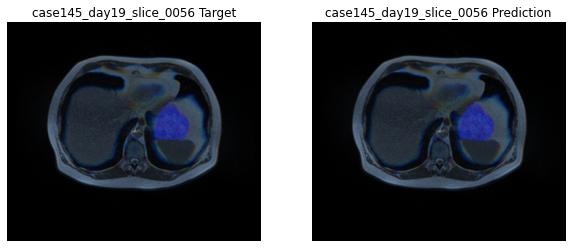

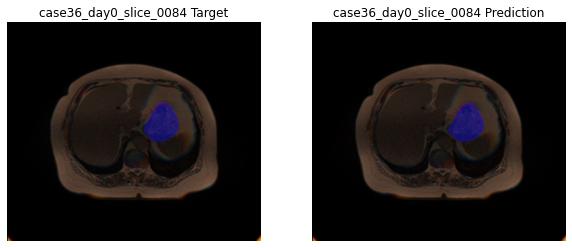

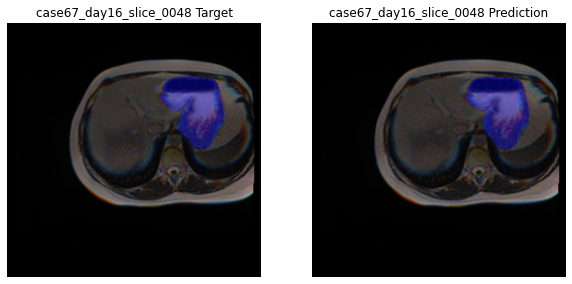

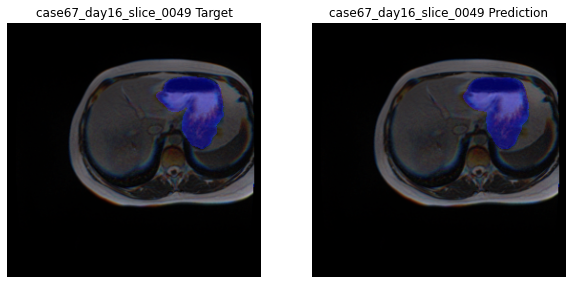

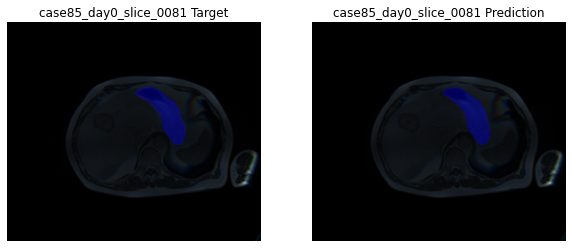

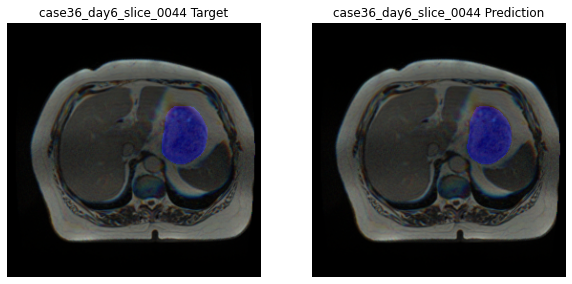

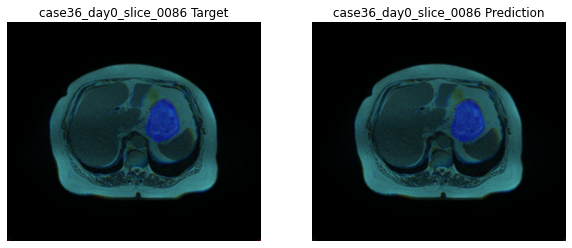

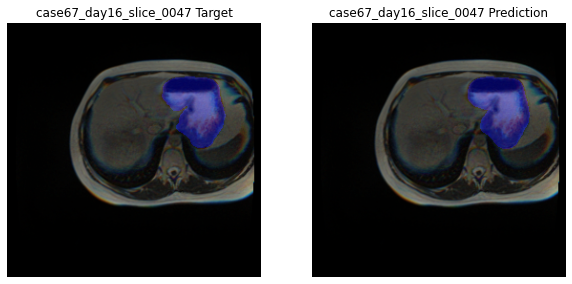

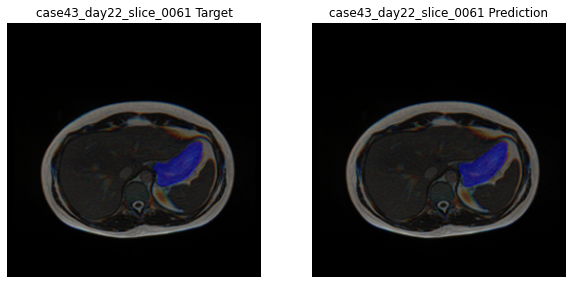

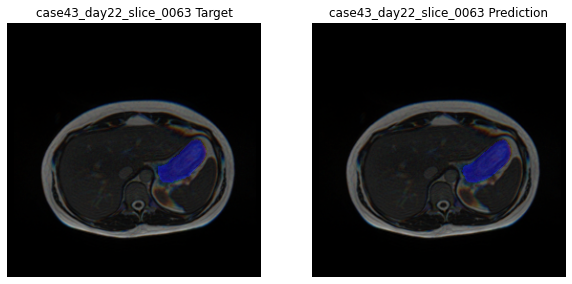

In [33]:
for i in range(10):
    plt_targ_pred(scores_idx_sorted[i]);


Ideas that could be dervied from this:
1. Look into where the model is behaving badly and add augmentations to the data to correct this
2. Check if the model is able to predict empty slices correctly
3. Check

In [34]:
val['score'] = after_dices

Are there slices with no segments that have predicted segments?

In [35]:
false_positives = val[(val['n_segs'] == 0) & (~val['score'].isna())].sort_values('score', ascending=False)

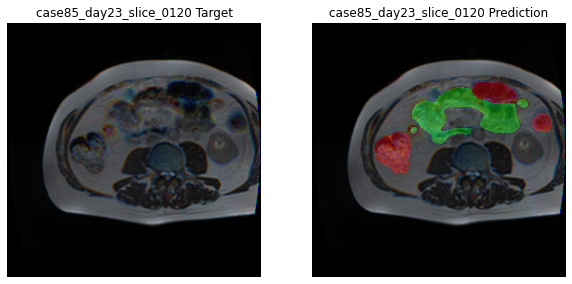

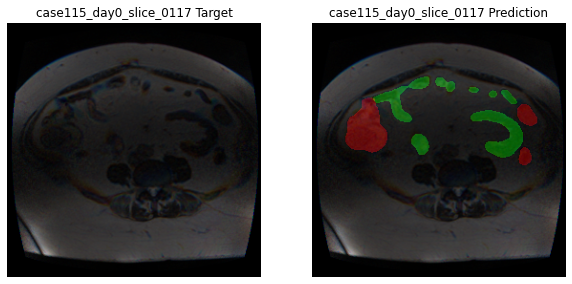

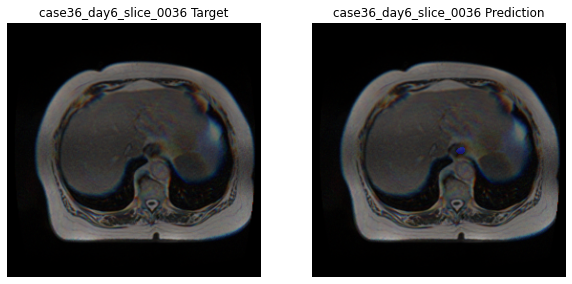

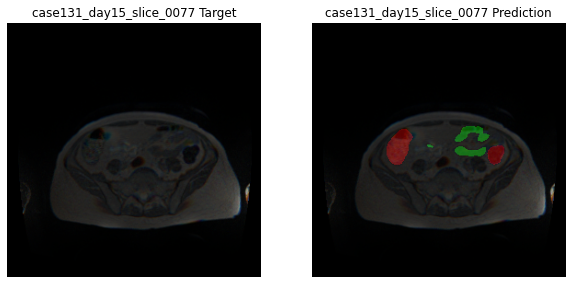

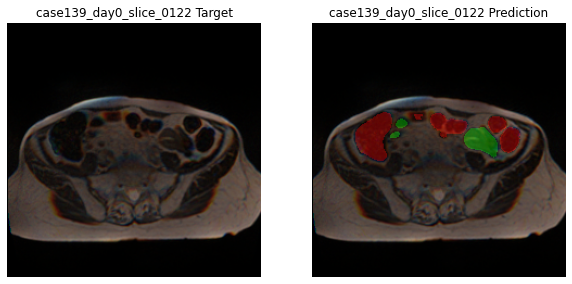

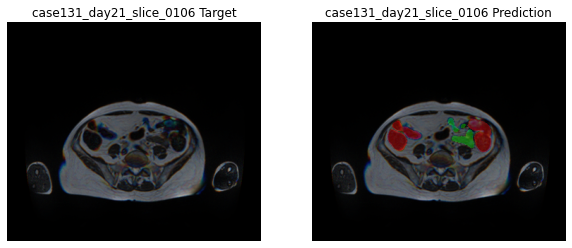

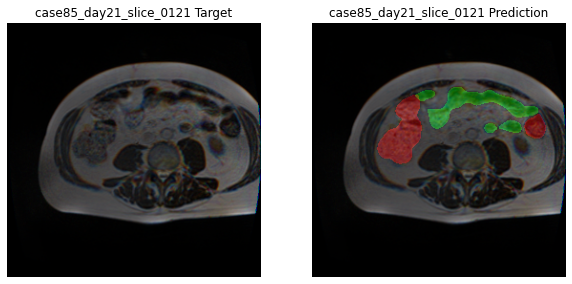

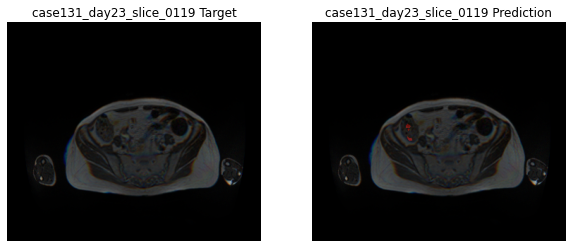

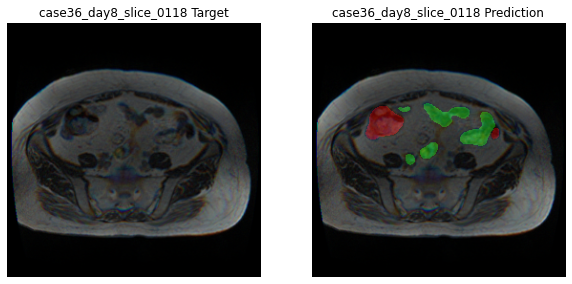

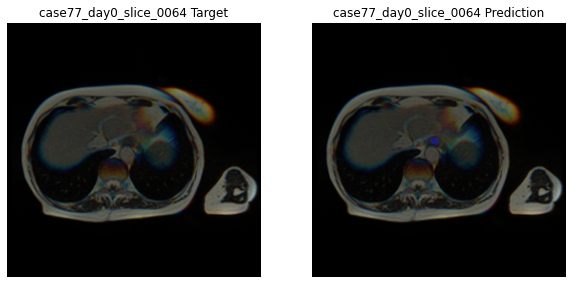

In [36]:
for i in false_positives.index[:10]:
    plt_targ_pred(i)

In [37]:
len(false_positives) / len(inp_masks)

0.02965885947046843

In [38]:
len(inp_masks)

7856

In [67]:
np.mean([s for s in after_dices if s not in [None]])

0.7145842658086371

In [69]:
np.mean([s for s in after_dices if s not in [None, 0]])

0.8087940300004482

In [70]:
(0.808 - 0.714) / 0.714

0.13165266106442589

13% increase in score if false positives are eliminated.

#### What kinds of images is the model failing to predict?

In [39]:
bad_predictions = val[(~val['score'].isna()) & (val['score'] > 0)].sort_values('score', ascending=True)

/tmp/ipykernel_1134/81718441.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 2, figsize=figsize)


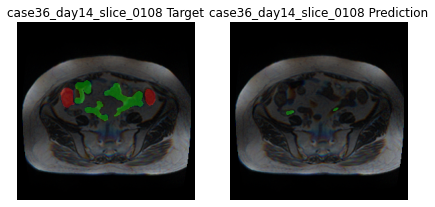

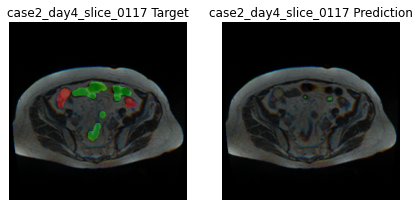

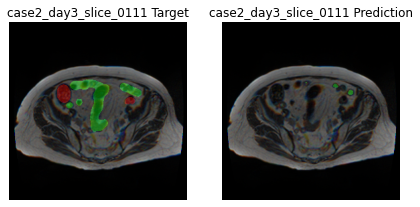

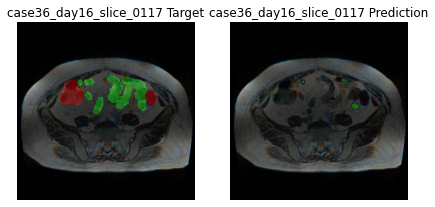

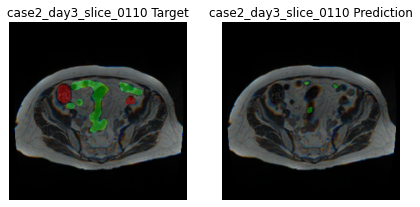

...

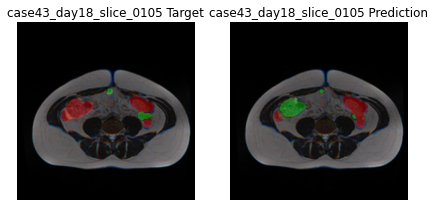

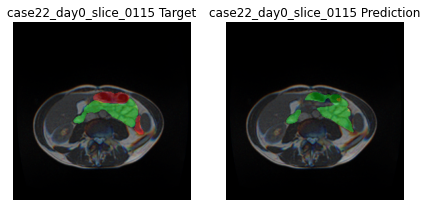

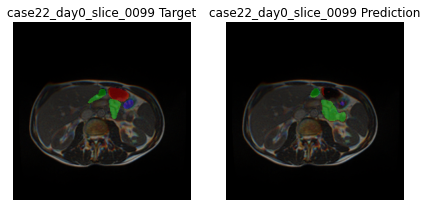

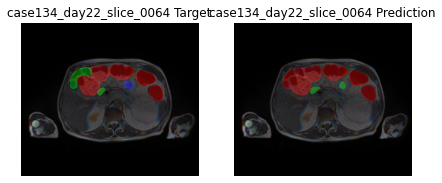

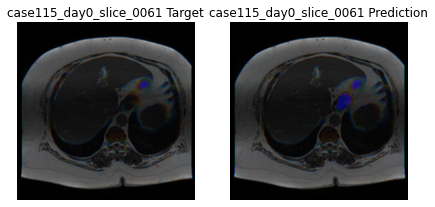

In [40]:
for i in bad_predictions.index[:100]:
    plt_targ_pred(i, (7, 7))

In [80]:
good_predictions = val[(~val['score'].isna()) & (val['score'] > 0)].sort_values('score', ascending=False)

/tmp/ipykernel_1757/81718441.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(1, 2, figsize=figsize)


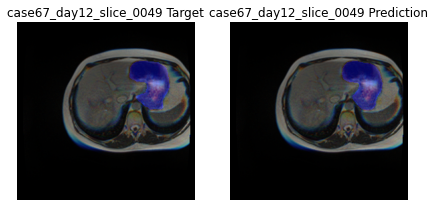

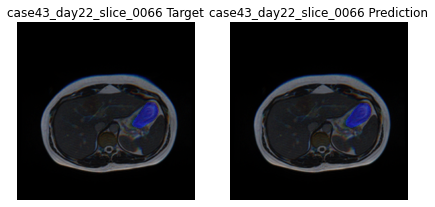

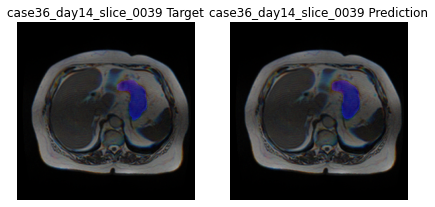

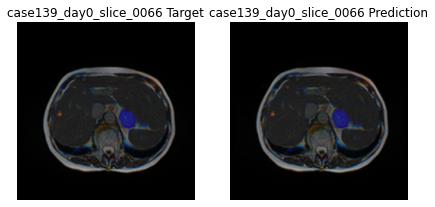

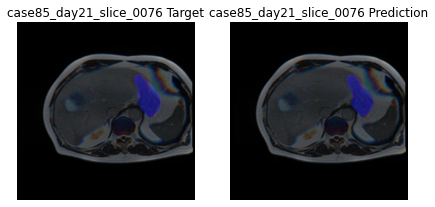

...

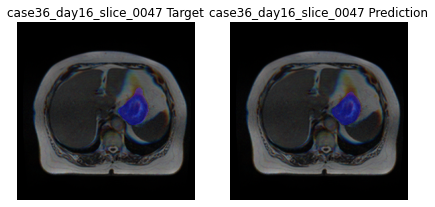

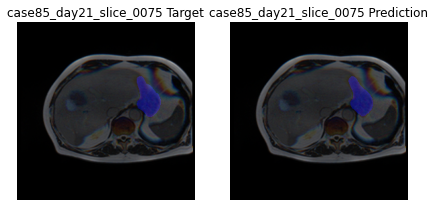

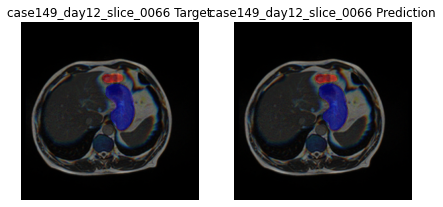

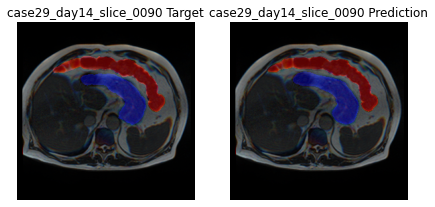

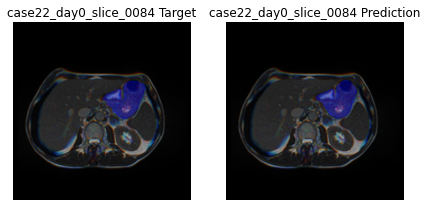

In [86]:
for i in good_predictions.index[100:200]:
    plt_targ_pred(i, (7, 7))

In [91]:
val['slice_no'] = val.slice_id.apply(lambda x: x.split('_')[-1]).astype(int)

<AxesSubplot:xlabel='slice_no', ylabel='score'>

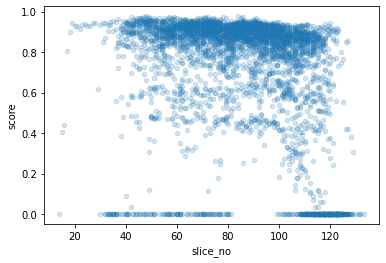

In [94]:
val.plot(x='slice_no', y='score', kind='scatter', alpha=0.2)

It seems that models beyond slice 100 have deteriorating performance with this model. 

What needs to be done next is to compare these results with a model that was trained over the whole dataset to see if the performance of this model is over fitting the leaderboard or not, and not decide how to improve upon the results of this model.

In [34]:
def plt_before_after(idx):
    fig, axes = plt.subplots(2, 2, figsize=(10, 10))
    axes = axes.flatten()
    
    print(before_dices[idx], after_dices[idx], val.iloc[idx]['slice_h'], val.iloc[idx]['slice_w'])
    
    # plot image and target before upsize
    decoded_small_img, decoded_small_mask = dls.decode((imgs[idx], targs[idx]))
    
    if decoded_small_img.shape[-1] > 3:
        decoded_small_img = decoded_small_img[:, [1, 2, 3], :]
        org_img = org_imgs[idx][[1, 2, 3], :, :]
        
    else:
        org_img = org_imgs[idx]
    
    show_image(decoded_small_img[0], cmap='gray', ctx=axes[0])
    show_image(decoded_small_mask, cmap='Spectral_r', alpha=0.35, ctx=axes[0], title="Target (Model size)")
    
    # plot image and pred before upsize
    show_image(decoded_small_img[0], cmap='gray', ctx=axes[1])
    show_image(preds_masks[idx]*255, cmap='Spectral_r', alpha=0.35, ctx=axes[1], title="Prediction (Model size)")
    
    # plot image and target after upsize
    show_image(org_img, ctx=axes[2])
    show_image(targ_masks[idx], cmap='Spectral_r', alpha=0.35, ctx=axes[2], title="Target (original)")
    
    # plot image and pred after upsize
    show_image(org_img, ctx=axes[3])
    show_image(np.moveaxis(inp_masks[idx], 0, -1)*255, cmap='Spectral_r', alpha=0.35, ctx=axes[3], title="Prediction (upsized)")

0.9736147742984246 0.9736147742984246 266 266


NameError: name 'imgs' is not defined

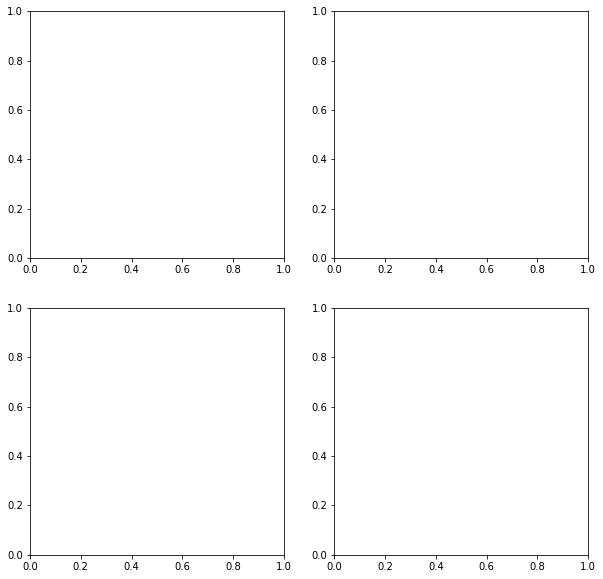

In [36]:
if DEBUG and VIZ: plt_before_after(scores_idx_sorted[3])

In [195]:
def get_gt_count(rle):
    if isinstance(rle, str):
        return np.sum([int(x) for i, x in enumerate(rle.split(' '), 1) if i % 2 == 0])
    else:
        return 0
    
    
train['slice_no'] = train['slice_id'].apply(lambda x: int(x.split('_')[1].lstrip('0')))
test['slice_no'] = test['slice_id'].apply(lambda x: int(x.split('_')[1].lstrip('0')))

train.pixels_count = train.slice_w * train.slice_h

train['lb_seg_count'] = train.lb_seg_rle.apply(get_gt_count)
train['sb_seg_count'] = train.sb_seg_rle.apply(get_gt_count)
train['st_seg_count'] = train.st_seg_rle.apply(get_gt_count)

train['lb_seg_prop'] = train.lb_seg_count/train.pixels_count
train['sb_seg_prop'] = train.sb_seg_count/train.pixels_count
train['st_seg_prop'] = train.st_seg_count/train.pixels_count

train['lb_seg_flag'] = train['lb_seg_flag'].astype(int)
train['sb_seg_flag'] = train['sb_seg_flag'].astype(int)
train['st_seg_flag'] = train['st_seg_flag'].astype(int)

test['lb_seg_flag'] = test['lb_seg_flag'].astype(int)
test['sb_seg_flag'] = test['sb_seg_flag'].astype(int)
test['st_seg_flag'] = test['st_seg_flag'].astype(int)

prop_thresh = train.groupby('slice_no')[['lb_seg_prop', 'sb_seg_prop', 'st_seg_prop']].mean()
lb_zero = [1, 138, 139, 140, 141, 142, 143, 144]
sb_zero = [1, 2, 3, 4, 5, 6, 7, 8, 9 ,10, 11, 138, 139, 140, 141, 142, 143, 144]
st_zero = [1, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144]

In [196]:
if INFER:
    bs = 24
    test_dl = learn.dls.test_dl(test, bs=bs, shuffle=False).to('cuda')
    b = test_dl.one_batch()

In [197]:
def mask2rle(mask):
    """
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    """
    mask = np.array(mask)
    pixels = mask.flatten()
    pad = np.array([0])
    pixels = np.concatenate([pad, pixels, pad])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]

    return " ".join(str(x) for x in runs)

def get_rle_masks(preds, df):
    rle_masks = []
    for pred, width, height in zip(preds, df['slice_w'], df['slice_h']):
        upsized_mask = resize_img_to_org_size(pred, (height, width))
        for i in range(3):
            rle_mask = mask2rle(upsized_mask[:, :, i])
            rle_masks.append(rle_mask)
    return rle_masks

In [198]:
def post_process(inp, slice_no):
    if inp.shape[-1] != 3: 
        sum_dims = (2, 3)
    else:
        sum_dims = (1, 2)
        
    pixels_count = inp.shape[sum_dims[0]] * inp.shape[sum_dims[1]]
    
    inp[np.where(inp.sum(sum_dims)/pixels_count < prop_thresh.loc[slice_no].values)] = 0
    
    return inp

In [199]:
if INFER:
    learn.model = learn.model.cuda()
    learn.model.eval()
    masks = []
    
    with torch.no_grad():
        for i, b in enumerate(tqdm(test_dl)):
            b.to('cuda')
            b_preds = (sigmoid(learn.model(b)[-1]) > 0.5).permute(0, 2, 3, 1).cpu().detach().numpy().astype(np.uint8)

            b_preds = post_process(b_preds, test.iloc[i*bs:i*bs+bs]['slice_no'].values)
            masks.extend(get_rle_masks(b_preds, test.iloc[i*bs:i*bs+bs]))

            # test_preds[i*bs:i*bs+bs] = b_preds
            del b_preds
            torch.cuda.empty_cache()
            gc.collect()

    # Post process predictions
    # test_preds = post_process(test_preds)

100%|██████████| 42/42 [00:38<00:00,  1.08it/s]


In [201]:
# if INFER:
#     learn.model = learn.model.cuda()
#     test_dl = learn.dls.test_dl(test, shuffle=False).to('cuda')
#     test_preds = get_preds(learn, test_dl)

In [202]:
# if INFER:
#     masks = get_rle_masks(test_preds, test)   

In [203]:
remove_seg_slices = {
     "large_bowel": [1, 138, 139, 140, 141, 142, 143, 144],
    "small_bowel": [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 138, 139, 140, 141, 142, 143, 144],
    "stomach": [1, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144],
}


def fix_empty_slices(_row):
    if _row['slice_no'] in remove_seg_slices[_row["class"]]:
        _row["predicted"] = ""
    return _row

def get_case_id(fname):
    if KAGGLE: i = 5
    elif GRADIENT: i = 2
    return fname.parts[i] + '_' + fname.parts[i+2][:10]

In [204]:
if INFER:
    submission = pd.DataFrame({
        'id': chain.from_iterable([[get_case_id(fname)]*3 for fname in test['fname']]),
        'class': chain.from_iterable([['large_bowel', 'small_bowel', 'stomach'] for _ in test['fname']]),
        'slice_no': chain.from_iterable([[slice_no]*3 for slice_no in test['slice_no']]),
        'predicted': masks,
    })
    
    submission = submission.apply(fix_empty_slices, axis=1)
    del submission['slice_no']
    
    if sample_submission.shape[0] > 0:
        del sample_submission['segmentation']
        
        submission = sample_submission.merge(submission, on=['id', 'class'])
        
    
    submission.to_csv('submission.csv', index=False)